In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 1
%pwd

'/ocean/projects/asc170022p/mtragoza/med_vqa'

In [3]:
import sys, os
import numpy as np
import pandas as pd

sys.path.append('../param_search')
import param_search as ps

In [14]:
job_template = '''\
#!/bin/bash
#SBATCH --job-name={job_name}
#SBATCH --account=bio170034p
#SBATCH --partition=BatComputer
#SBATCH --gres=gpu:rtx6000:2
#SBATCH --time=12:00:00
#SBATCH -o %J.stdout
#SBATCH -e %J.stderr
#SBATCH --mail-type=fail

hostname
pwd
module load anaconda3
conda activate /ocean/projects/asc170022p/mtragoza/mambaforge/envs/med_vqa

python ../../train.py \\
    --out_name {job_name} \\
    --image_encoder {image_encoder} \\
    --text_decoder {text_decoder} \\
    --learning_rate {learning_rate}
'''
name_template = 'train_{image_encoder}_{text_decoder}_{learning_rate:.0e}'

In [15]:
param_space = ps.ParamSpace(
    learning_rate=[1e-5, 1e-4, 1e-3],
    image_encoder=['CLIP', 'PMC-CLIP'],
    text_decoder=['LLaMA', 'PMC-LLaMA'],
)
for p in param_space:
    print(name_template.format(**p))

len(param_space)

train_CLIP_LLaMA_1e-05
train_CLIP_PMC-LLaMA_1e-05
train_PMC-CLIP_LLaMA_1e-05
train_PMC-CLIP_PMC-LLaMA_1e-05
train_CLIP_LLaMA_1e-04
train_CLIP_PMC-LLaMA_1e-04
train_PMC-CLIP_LLaMA_1e-04
train_PMC-CLIP_PMC-LLaMA_1e-04
train_CLIP_LLaMA_1e-03
train_CLIP_PMC-LLaMA_1e-03
train_PMC-CLIP_LLaMA_1e-03
train_PMC-CLIP_PMC-LLaMA_1e-03


12

In [16]:
expt_name = '2024-04-16_pretrain'
jobs = ps.submit(job_template, name_template, param_space, work_dir=expt_name, verbose=True)
jobs.to_csv(f'{expt_name}.jobs')

100%|██████████| 12/12 [00:02<00:00,  5.28it/s]
[23469730, 23469731, 23469732, 23469733, 23469734, 23469735, 23469736, 23469737, 23469738, 23469739, 23469740, 23469741]


/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/job_queues.py:235: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .replace('', float('nan')).map(pd.to_numeric)


In [133]:
status = ps.status(jobs)
status['job_state'] = status['job_state'].fillna('DONE')
status['stdout'] = status['stdout'].fillna('None')
status['stderr'] = status['stderr'].fillna('None')
status

/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/job_queues.py:235: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .replace('', float('nan')).map(pd.to_numeric)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/__init__.py:80: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[nan nan nan nan nan nan nan nan 'RUNNING' 'RUNNING' 'RUNNING' 'RUNNING']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  status.update(new_status)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/__init__.py:80: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future er

,index,learning_rate,image_encoder,text_decoder,job_name,partition,job_state,node_id,runtime,work_dir,array_idx,stdout,stderr
job_id,,,,,,,,,,,,,
23469730,0,0.00001,CLIP,LLaMA,train_CLIP_LLaMA_1e-05,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469731,1,0.00001,CLIP,PMC-LLaMA,train_CLIP_PMC-LLaMA_1e-05,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469732,2,0.00001,PMC-CLIP,LLaMA,train_PMC-CLIP_LLaMA_1e-05,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469733,3,0.00001,PMC-CLIP,PMC-LLaMA,train_PMC-CLIP_PMC-LLaMA_1e-05,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469734,4,0.00010,CLIP,LLaMA,train_CLIP_LLaMA_1e-04,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nDownloading shards: 0%| | 0/2 [00...
23469735,5,0.00010,CLIP,PMC-LLaMA,train_CLIP_PMC-LLaMA_1e-04,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469736,6,0.00010,PMC-CLIP,LLaMA,train_PMC-CLIP_LLaMA_1e-04,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469737,7,0.00010,PMC-CLIP,PMC-LLaMA,train_PMC-CLIP_PMC-LLaMA_1e-04,BatComputer,DONE,NaN,NaN,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nLoading checkpoint shards: 0%| | ...
23469738,8,0.00100,CLIP,LLaMA,train_CLIP_LLaMA_1e-03,BatComputer,RUNNING,dv004,5:10:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,NaN,dv004.ib.bridges2.psc.edu\n/ocean/projects/asc...,\nDownloading shards: 0%| | 0/2 [00...


In [135]:
status.groupby(['job_state', 'stderr'])[['job_name']].count()

job_name
job_state stderr                                                      
DONE      \nDownloading shards:   0%|          | 0/2 [00:...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
RUNNING   \nDownloading shards:   0%|          | 0/2 [00:...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1
          \nLoading checkpoint shards:   0%|          | 0...         1

In [136]:
print(status.iloc[0].stdout)

dv004.ib.bridges2.psc.edu
/ocean/projects/asc170022p/mtragoza/med_vqa/2024-04-16_pretrain/train_CLIP_LLaMA_1e-05
Available GPU devices:
  GPU 0: NVIDIA RTX A6000
  GPU 1: NVIDIA RTX A6000
Loading CLIP image encoder...Done (13.1944 s)
Loading LLaMA text decoder...
Done (156.0371 s)
Creating VQA model...Done (0.0571 s)
Loading VQA-RAD dataset...Done (7.3883 s)
Testing forward pass...
Done (2.3279 s)
Trainable parameters:  before LORA: 7.045794e+09 params
  after LORA: 3.276554e+08 params
Done (0.6789 s)
Start training loop
Epoch 0 / 10
Training...
Epoch 0 train loss = 2.3612139992631622
Evaluating...
Epoch 0 val loss = 0.12815610688608303
Saving model...
Epoch 1 / 10
Training...
Epoch 1 train loss = 0.09344821514557623
Evaluating...
Epoch 1 val loss = 0.07743231876365907
Saving model...
Epoch 2 / 10
Training...
Epoch 2 train loss = 0.07009766497265522
Evaluating...
Epoch 2 val loss = 0.06563101755043046
Saving model...
Epoch 3 / 10
Training...
Epoch 3 train loss = 0.061911675892355446
Ev

In [137]:
print(status.iloc[0].stderr)


Loading checkpoint shards: 100%|██████████| 2/2 [02:34<00:00, 77.23s/it]



Generating train split: 100%|██████████| 1793/1793 [00:00<00:00, 16333.08 examples/s]

Generating test split: 100%|██████████| 451/451 [00:00<00:00, 15835.25 examples/s]
/ocean/projects/asc170022p/mtragoza/mambaforge/envs/med_vqa/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1711403388920/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,

train loss = 0.08592768758535385: 100%|██████████| 449/449 [33:00<00:00,  4.41s/it]

val loss = 0.11877618730068207: 100%|██████████| 113/113 [03:49<00:00,  2.03s/it]

train loss = 0.08363889902830124: 100%|██████████| 449/449 [30:13<00:00,  4.04s/it]

val loss = 0.12145113199949265: 100%|██████████| 113/113 [04:19<00:00,  2.30s/it]

train loss = 0.10356215387582779: 100%|██████████| 449/449 [30

In [138]:
m = ps.metrics(jobs, sep=',')
m

,learning_rate,image_encoder,text_decoder,job_name,job_id,partition,job_state,node_id,runtime,work_dir,...,phase,step,loss,exact_match,similarity,bleu_score,precision1,precision2,precision3,precision4
0,0.00001,CLIP,LLaMA,train_CLIP_LLaMA_1e-05,23469730,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,train,0,13.676543,0.0,0.254902,0.0,0.0,0.0,0.0,0.0
1,0.00001,CLIP,LLaMA,train_CLIP_LLaMA_1e-05,23469730,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,train,1,12.848603,0.0,0.065217,0.0,0.0,0.0,0.0,0.0
2,0.00001,CLIP,LLaMA,train_CLIP_LLaMA_1e-05,23469730,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,train,2,12.584761,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
3,0.00001,CLIP,LLaMA,train_CLIP_LLaMA_1e-05,23469730,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,train,3,12.476251,0.0,0.130952,0.0,0.0,0.0,0.0,0.0
4,0.00001,CLIP,LLaMA,train_CLIP_LLaMA_1e-05,23469730,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,train,4,11.396324,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63501,0.00100,PMC-CLIP,PMC-LLaMA,train_PMC-CLIP_PMC-LLaMA_1e-03,23469741,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,val,108,0.643166,0.0,0.010204,0.0,0.0,0.0,0.0,0.0
63502,0.00100,PMC-CLIP,PMC-LLaMA,train_PMC-CLIP_PMC-LLaMA_1e-03,23469741,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,val,109,0.587219,0.0,0.023810,0.0,0.0,0.0,0.0,0.0
63503,0.00100,PMC-CLIP,PMC-LLaMA,train_PMC-CLIP_PMC-LLaMA_1e-03,23469741,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,val,110,0.668236,0.0,0.047379,0.0,0.0,0.0,0.0,0.0
63504,0.00100,PMC-CLIP,PMC-LLaMA,train_PMC-CLIP_PMC-LLaMA_1e-03,23469741,BatComputer,PENDING,(None),0:00,/ocean/projects/asc170022p/mtragoza/med_vqa/20...,...,val,111,0.581563,0.0,0.031250,0.0,0.0,0.0,0.0,0.0


In [139]:
m.groupby('job_name')[['epoch']].describe()

epoch                                       \
                                 count mean       std  min   25%  50%   75%   
job_name                                                                      
train_CLIP_LLaMA_1e-03          5058.0  4.0  2.582244  0.0  2.00  4.0  6.00   
train_CLIP_LLaMA_1e-04          5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_CLIP_LLaMA_1e-05          5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_CLIP_PMC-LLaMA_1e-03      4496.0  3.5  2.291543  0.0  1.75  3.5  5.25   
train_CLIP_PMC-LLaMA_1e-04      5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_CLIP_PMC-LLaMA_1e-05      5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_PMC-CLIP_LLaMA_1e-03      4496.0  3.5  2.291543  0.0  1.75  3.5  5.25   
train_PMC-CLIP_LLaMA_1e-04      5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_PMC-CLIP_LLaMA_1e-05      5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_PMC-CLIP_PMC-LLaMA_1e-03  4496.0  3.5  2.291543  0.0  1.75  3.5  5.25   
train_PMC-CLIP_PMC-LLaMA_1e-04  5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   
train_PMC-CLIP_PMC-LLaMA_1e-05  5620.0  4.5  2.872537  0.0  2.00  4.5  7.00   

                                     
                                max  
job_name                             
train_CLIP_LLaMA_1e-03          8.0  
train_CLIP_LLaMA_1e-04          9.0  
train_CLIP_LLaMA_1e-05          9.0  
train_CLIP_PMC-LLaMA_1e-03      7.0  
train_CLIP_PMC-LLaMA_1e-04      9.0  
train_CLIP_PMC-LLaMA_1e-05      9.0  
train_PMC-CLIP_LLaMA_1e-03      7.0  
train_PMC-CLIP_LLaMA_1e-04      9.0  
train_PMC-CLIP_LLaMA_1e-05      9.0  
train_PMC-CLIP_PMC-LLaMA_1e-03  7.0  
train_PMC-CLIP_PMC-LLaMA_1e-04  9.0  
train_PMC-CLIP_PMC-LLaMA_1e-05  9.0

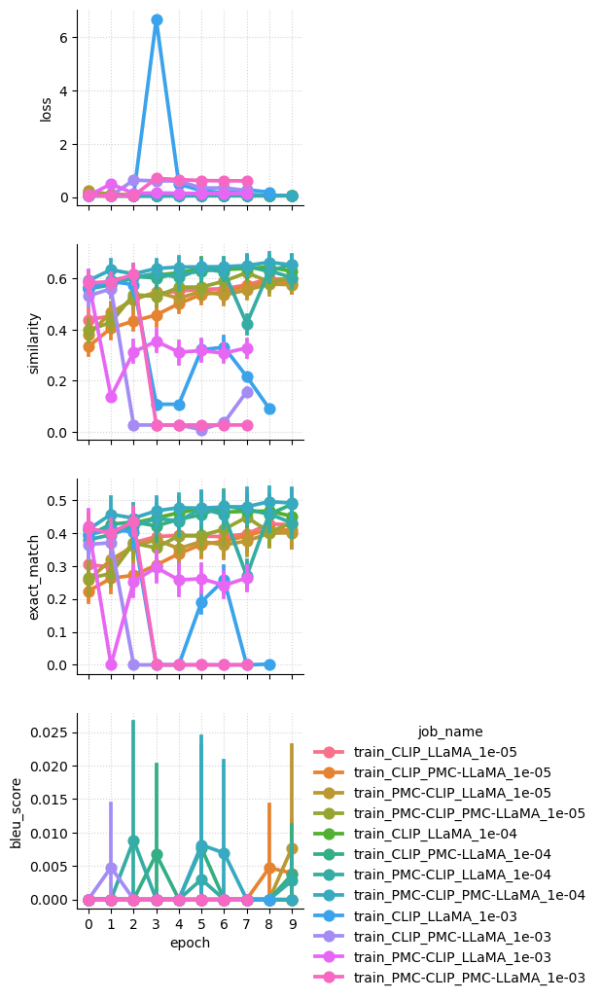

In [141]:
fig = ps.plot(
    m[m.phase == 'val'],
    x='epoch',
    y=['loss', 'similarity', 'exact_match', 'bleu_score'],
    hue='job_name'
)

/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 3.0}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` param

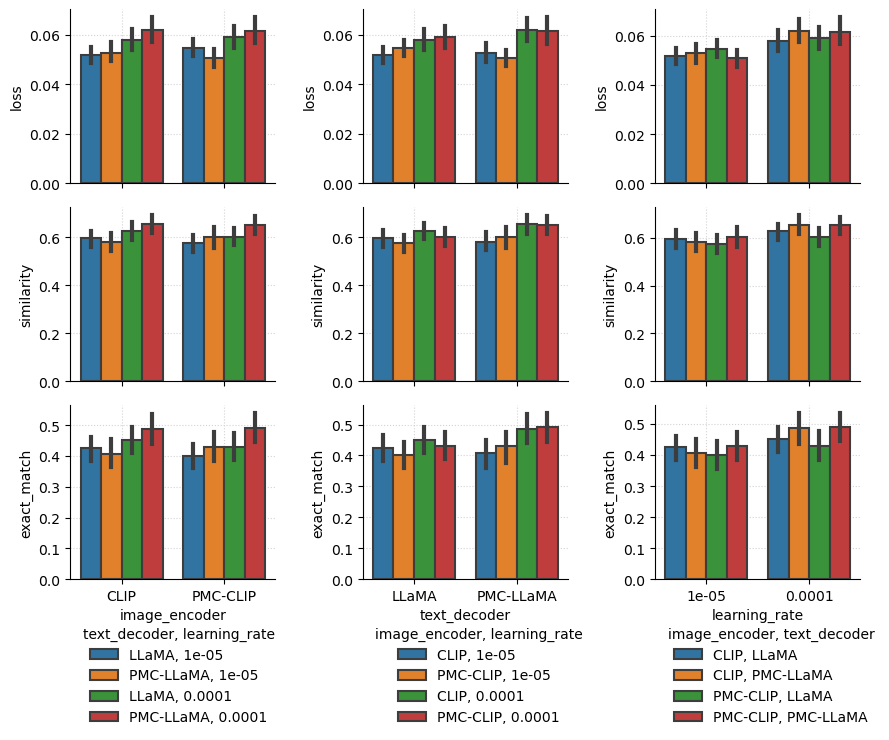

In [144]:
import seaborn as sns

fig = ps.plot(
    m[(m.epoch == 9) & (m.phase == 'val')],
    x=['image_encoder', 'text_decoder', 'learning_rate'],
    y=['loss', 'similarity', 'exact_match'],
    legend_kws=dict(bbox_to_anchor=(0,-0.2)),
    plot_func=ps.results.barplot,
    tight=True,
    height=2.5
)

In [114]:
m['pretrained_models'] = m['image_encoder'] + '\n' + m['text_decoder']
m['pretrained_models']

0                CLIP\nLLaMA
1                CLIP\nLLaMA
2                CLIP\nLLaMA
3                CLIP\nLLaMA
4                CLIP\nLLaMA
                ...         
54509    PMC-CLIP\nPMC-LLaMA
54510    PMC-CLIP\nPMC-LLaMA
54511    PMC-CLIP\nPMC-LLaMA
54512    PMC-CLIP\nPMC-LLaMA
54513    PMC-CLIP\nPMC-LLaMA
Name: pretrained_models, Length: 54514, dtype: object

/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 3.0}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` param

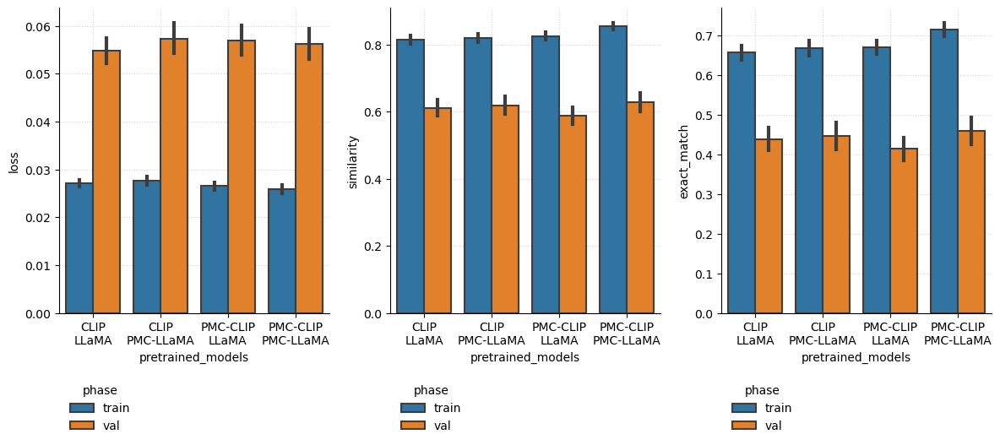

In [126]:
fig = ps.plot(
    m[(m.epoch == 9)],
    x=['pretrained_models'],
    y=['loss', 'similarity', 'exact_match'],
    hue='phase',
    legend_kws=dict(bbox_to_anchor=(0,-0.2)),
    plot_func=ps.results.barplot,
    tight=True,
    height=5.5, width=4, n_cols=3
)

/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 3.0}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` param

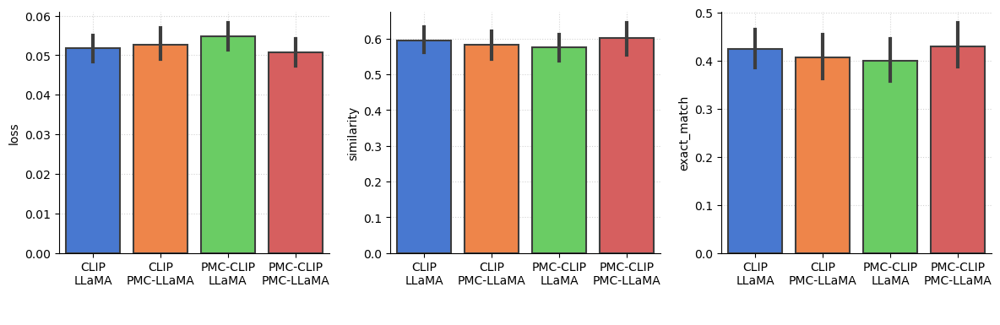

In [131]:
fig = ps.plot(
    m[(m.epoch == 9) & (m.phase == 'val') & (m.learning_rate == 1e-5)],
    x=['pretrained_models'],
    y=['loss', 'similarity', 'exact_match'],
    legend_kws=dict(bbox_to_anchor=(0,-0.2)),
    plot_func=ps.results.barplot,
    tight=True,
    height=4, width=4, n_cols=3
)
colors = sns.color_palette('muted')

for ax in fig.axes:
    ax.set_xlabel(None)
    for bar_container in ax.containers:
        for i, bar in enumerate(bar_container):
            bar.set_facecolor(colors[i])

/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 3.0}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errcolor` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'color': '#3d3d3d'}` instead.

  ax = sns.barplot(errwidth=lw * 2, errcolor=gray, *args, **kwargs)
/ocean/projects/asc170022p/mtragoza/med_vqa/../param_search/param_search/results.py:329: FutureWarning: 

The `errwidth` param

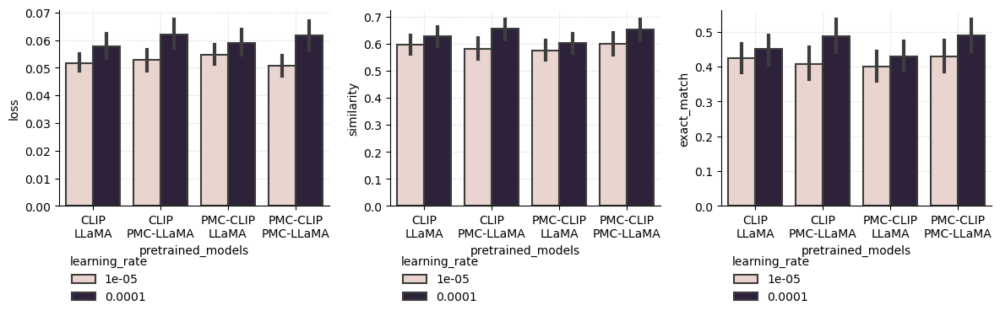

In [128]:
fig = ps.plot(
    m[(m.epoch == 9) & (m.phase == 'val')],
    x=['pretrained_models'],
    y=['loss', 'similarity', 'exact_match'],
    hue='learning_rate',
    legend_kws=dict(bbox_to_anchor=(0,-0.2)),
    plot_func=ps.results.barplot,
    tight=True,
    height=4, width=4, n_cols=3
)

In [107]:
import sys, os

import data, models, train

In [106]:
%pwd

'/ocean/projects/asc170022p/mtragoza/med_vqa'

In [ ]:
save_path = '2024-04-16_pretrain/train_PMC-CLIP_PMC-LLaMA_1e-05/train_PMC-CLIP_PMC-LLaMA_1e-05_epoch_7.pt'
